In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt

from config import Config
import utils
import model as modellib
import visualize
from model import log

%matplotlib inline 

# Root directory of the project
ROOT_DIR = os.getcwd()

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to COCO trained weights
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

/opt/anaconda3/lib/python3.5/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
from numpy.random import seed
seed(98052)
from tensorflow import set_random_seed
set_random_seed(98052)

In [3]:
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [4]:
CATEGORIES = ['waterways', 'fieldborders', 'terraces', 'wsb']
CLASS_DICT = {1: 'waterways', 2: 'fieldborders', 3: 'terraces', 4: 'wsb'}
NUM_CLASSES = 4

epoch = 100

IMAGE_H = 256
IMAGE_W = 256

JPG_NAME = 'jpg'

logs = 'coco20180328T0043'# lr = 0.0001

val_dir = '/data/a/LOLRaw/data/processed_large/fourclasses/test'


In [5]:
class LOLConfig(Config):
    """Configuration for training on MS COCO.
    Derives from the base Config class and overrides values specific
    to the COCO dataset.
    """
    # Give the configuration a recognizable name
    NAME = "coco"

    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1

    # Use small images for faster training. Set the limits of the small side
    # the large side, and that determines the image shape.
    IMAGE_MIN_DIM = 128
    IMAGE_MAX_DIM = 256
    # Uncomment to train on 8 GPUs (default is 1)
    # GPU_COUNT = 8

    # Number of classes (including background)
    NUM_CLASSES = 1 + NUM_CLASSES  # COCO has 80 classes
    
config = LOLConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[64 64]
 [32 32]
 [16 16]
 [ 8  8]
 [ 4  4]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  256
IMAGE_MIN_DIM                  128
IMAGE_PADDING                  True
IMAGE_SHAPE                    [256 256   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           coco
NUM_CLASSES                    5
POOL_SIZE                      7
POST_NMS_ROIS_INFERENCE        1000
POST_NMS_ROIS_TRAINING         2000
ROI_PO

## helper function

In [6]:
def get_ax(rows=1, cols=1, size=8):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Change the default size attribute to control the size
    of rendered images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [7]:
def generate_mask_path(mask_dir, filename):
    fn_img, ext = os.path.splitext(os.path.basename(filename))
    mask_endings = [x for x in CATEGORIES if x != fn_img.split('_')[0]]
    mask_path = [os.path.join(mask_dir, filename)]
    for ending in mask_endings:
        mask_path.append( os.path.join(mask_dir, fn_img + '_'+ ending + '.jpg'))
    return mask_path

In [8]:
def jaccard_coef(y_true, y_pred):
    intersec = y_true*y_pred
    union = np.logical_or(y_true, y_pred).astype(int)
    if intersec.sum() == 0:
        jac_coef = 0
    else:
        jac_coef = intersec.sum()/union.sum()
    return jac_coef

In [9]:
## plot predict masks over the true values
import colorsys
from skimage.measure import find_contours
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon

def random_colors(N, bright=True):
    """
    Generate random colors.
    To get visually distinct colors, generate them in HSV space then
    convert to RGB.
    """
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors


def apply_mask(image, mask, color, alpha=0.5):
    """Apply the given mask to the image.
    """
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

def display_instances(image, boxes, masks, class_ids, class_names,
                      scores=None, title="",
                      figsize=(16, 16), ax=None):
    
    # Number of instances
    N = masks.shape[2]

    if not ax:
        _, ax = plt.subplots(1, figsize=figsize)

    # Generate random colors
    colors = random_colors(N)

    # Show area outside image boundaries.
    height, width = image.shape[:2]
    ax.set_ylim(height + 10, -10)
    ax.set_xlim(-10, width + 10)
    ax.axis('off')
    ax.set_title(title)

    masked_image = image.astype(np.uint32).copy()
    for i in range(N):
        color = colors[i]
        print (color)
        # Mask
        mask = masks[:, :, i]
        masked_image = apply_mask(masked_image, mask, color)

        # Mask Polygon
        # Pad to ensure proper polygons for masks that touch image edges.
        padded_mask = np.zeros(
            (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
        padded_mask[1:-1, 1:-1] = mask
        contours = find_contours(padded_mask, 0.5)
        for verts in contours:
            # Subtract the padding and flip (y, x) to (x, y)
            verts = np.fliplr(verts) - 1
            p = Polygon(verts, facecolor="none", edgecolor=color)
            ax.add_patch(p)
    ax.imshow(masked_image.astype(np.uint8))
    plt.show()
    return masked_image.astype(np.uint8)

## input data

In [10]:
class LolDataset(utils.Dataset):
    
    def load_LOL(self, datasetdir):
        
        for i in range(NUM_CLASSES):
            self.add_class("shapes", i, CLASS_DICT[i+1] )
        
        image_dir = os.path.join(datasetdir, JPG_NAME)
        mask_dir = os.path.join(datasetdir, 'polygon')
        
        image_names = next(os.walk(image_dir))[2]
        for i in range(len(image_names)):
            self.add_image("shapes", image_id = i,
                    path=os.path.join(image_dir, image_names[i]),
                    mask_path = generate_mask_path(mask_dir, image_names[i]),
                    width=IMAGE_W,
                    height=IMAGE_H)
        
    def load_image(self, image_id):
        info = self.image_info[image_id]
        image_path = info['path']
        image_BGR = cv2.imread(image_path)
        image = cv2.cvtColor(image_BGR, cv2.COLOR_BGR2RGB)
        return image

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        mask_path = info['mask_path']
        valid_mask = []
        for _mask_path in mask_path:
            _mask = cv2.imread(_mask_path, 0)
            
            if _mask.max() == _mask.min():
                pass
            else:
                valid_mask.append(_mask_path)
             
        count = len(valid_mask)
        mask = np.zeros([info['height'], info['width'], count], 'uint8')
        shapes = []
        for i in range(count):
            img_array = cv2.imread(valid_mask[i], 0)
            (thresh, im_bw) = cv2.threshold(img_array, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
            mask_array = (img_array < thresh).astype('uint8')
            mask[:, :, i:i+1] = np.expand_dims(mask_array, axis=2)
            fn_img, ext = os.path.splitext(valid_mask[i])

            if fn_img.split('_')[-1] == 'merged':
                shapes.append(fn_img.split('/')[-1].split('_')[0])
            else:
                shapes.append(fn_img.split('_')[-1])
        # Map class names to class IDs.
        class_ids = np.array([self.class_names.index(s) for s in shapes])
        
        return mask, class_ids

In [11]:
dataset_val = LolDataset()
dataset_val.load_LOL(val_dir)
dataset_val.prepare()

## import model

In [12]:
class InferenceConfig(LOLConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)


In [13]:
def IDtoName(image_id):
    for i in range(len(dataset_val.image_info)):
        if image_id == dataset_val.image_info[i]['id']:
            image_name = dataset_val.image_info[i]['path'].split('/')[-1]
    return image_name
    

In [14]:
def NametoID(image_name):
    for i in range(len(dataset_val.image_info)):
        if image_name == dataset_val.image_info[i]['path'].split('/')[-1]:
            image_id = dataset_val.image_info[i]['id']
    return image_id

## experiments

In [15]:
model_path = '/home/tinzha/Projects/LandOLakes/logs/' + logs + '/mask_rcnn_coco_'+"{0:0=4d}".format(epoch)+'.h5'

print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180328T0043/mask_rcnn_coco_0100.h5


waterways_1691_4109150_merged.jpg
Processing 1 images
image                    shape: (256, 256, 3)         min:    9.00000  max:  214.00000
molded_images            shape: (1, 256, 256, 3)      min: -114.70000  max:   92.20000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
(0.0, 1.0, 1.0)
(0.5, 0.0, 1.0)
(0.5, 1.0, 0.0)
(1.0, 0.0, 0.0)


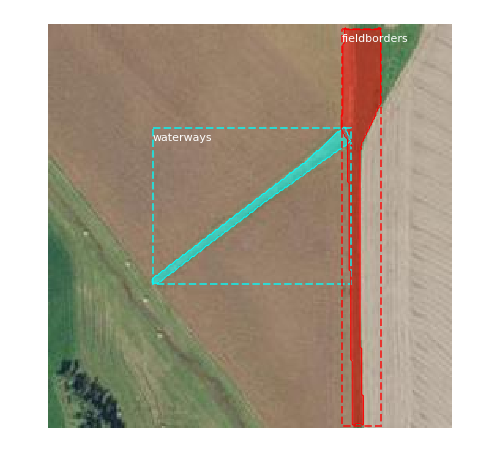

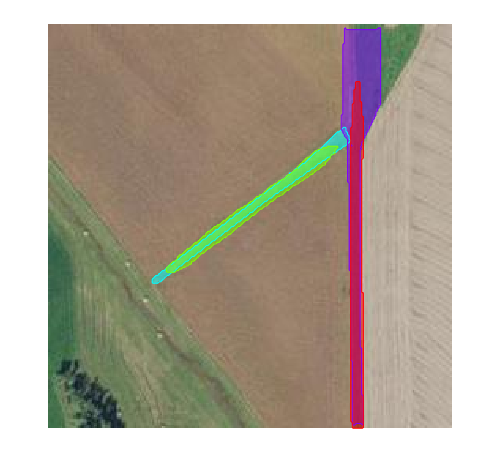

In [36]:
image_id = 90
print (IDtoName(image_id))

original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
modellib.load_image_gt(dataset_val, inference_config, 
                       image_id, use_mini_mask=False)

visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                            dataset_val.class_names, figsize=(8, 8))

results = model.detect([original_image], verbose=1)
r = results[0]

plot_masks = np.concatenate((gt_mask, r['masks']), axis = -1)
plot_ids = np.concatenate((gt_class_id, r['class_ids']), axis = -1)
img = display_instances(original_image, r['rois'], plot_masks, plot_ids, 
                            dataset_val.class_names, r['scores'], ax=get_ax())

groundtruth


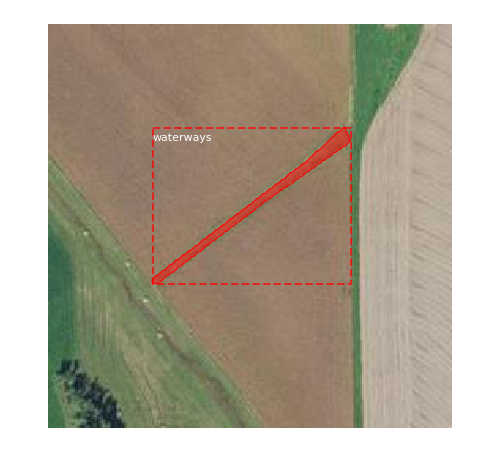

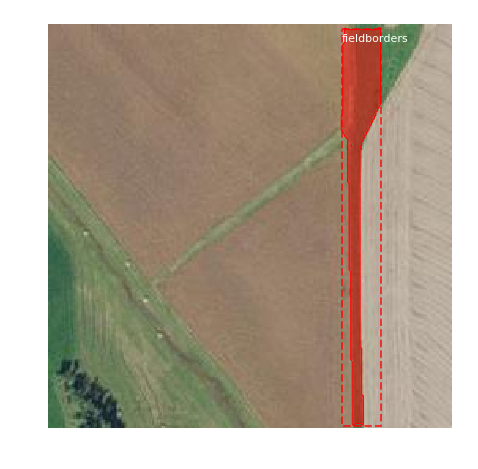

In [40]:
# print each groundtruth mask
print ('groundtruth')
for index in range(gt_mask.shape[2]):
    visualize.display_instances(original_image, gt_bbox[index:index+1,:], gt_mask[:,:,index:index+1], gt_class_id[index:index+1,], 
                            dataset_val.class_names, figsize=(8, 8))

predicted results


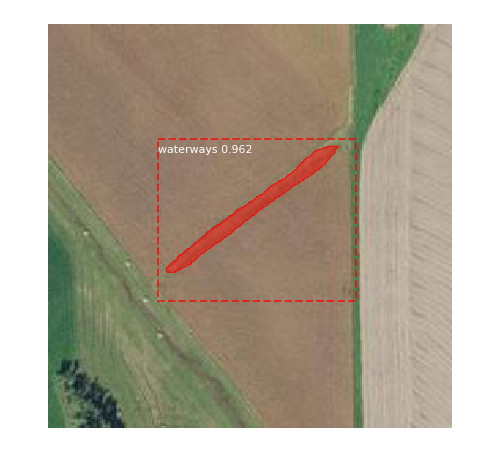

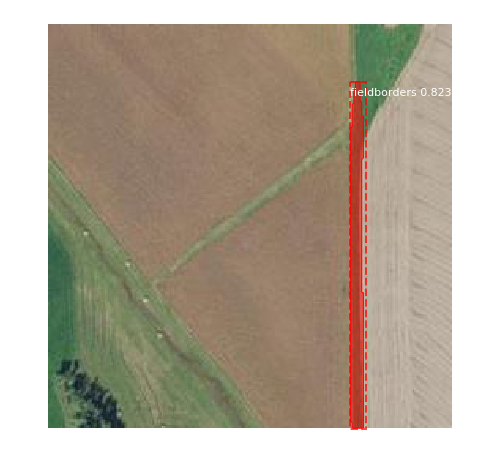

In [41]:
# print each predicted mask
print ('predicted results')
for index in range(r['masks'].shape[2]):
    visualize.display_instances(original_image, r['rois'][index:index+1,:], r['masks'][:,:,index:index+1], r['class_ids'][index:index+1,], 
                            dataset_val.class_names, r['scores'][index:index+1,], ax=get_ax())

In [102]:
def trim_zeros(x):
    """It's common to have tensors larger than the available data and
    pad with zeros. This function removes rows that are all zeros.

    x: [rows, columns].
    """
    assert len(x.shape) == 2
    return x[~np.all(x == 0, axis=1)]

In [106]:
def compute_iou(box, boxes, box_area, boxes_area):
    """Calculates IoU of the given box with the array of the given boxes.
    box: 1D vector [y1, x1, y2, x2]
    boxes: [boxes_count, (y1, x1, y2, x2)]
    box_area: float. the area of 'box'
    boxes_area: array of length boxes_count.

    Note: the areas are passed in rather than calculated here for
          efficency. Calculate once in the caller to avoid duplicate work.
    """
    # Calculate intersection areas
    y1 = np.maximum(box[0], boxes[:, 0])
    y2 = np.minimum(box[2], boxes[:, 2])
    x1 = np.maximum(box[1], boxes[:, 1])
    x2 = np.minimum(box[3], boxes[:, 3])
    intersection = np.maximum(x2 - x1, 0) * np.maximum(y2 - y1, 0)
    union = box_area + boxes_area[:] - intersection[:]
    iou = intersection / union
    return iou

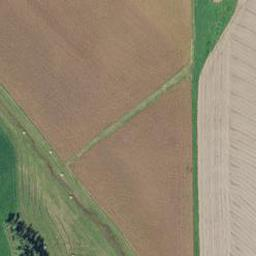

In [22]:
# from PIL import Image
# im = Image.fromarray(original_image)
# im
# im.save("your_file.jpeg")

In [104]:
def compute_overlaps(boxes1, boxes2):
    """Computes IoU overlaps between two sets of boxes.
    boxes1, boxes2: [N, (y1, x1, y2, x2)].

    For better performance, pass the largest set first and the smaller second.
    """
    # Areas of anchors and GT boxes
    area1 = (boxes1[:, 2] - boxes1[:, 0]) * (boxes1[:, 3] - boxes1[:, 1])
    area2 = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])

    # Compute overlaps to generate matrix [boxes1 count, boxes2 count]
    # Each cell contains the IoU value.
    overlaps = np.zeros((boxes1.shape[0], boxes2.shape[0]))
    for i in range(overlaps.shape[1]):
        box2 = boxes2[i]
        overlaps[:, i] = compute_iou(box2, boxes1, area2[i], area1)
    return overlaps

In [112]:
len(gt_bbox), len(gt_class_id), len(r['class_ids'])

(3, 3, 1)

In [194]:
x = []
y = []

In [205]:
for image_id in dataset_val.image_ids:   
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, inference_config, 
                           image_id, use_mini_mask=False)

#     visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
#                                 dataset_val.class_names, figsize=(8, 8))
    
#     visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
#                                 dataset_val.class_names, r['scores'], ax=get_ax())
    results = model.detect([original_image], verbose=1)
    r = results[0]

    gt_boxes = gt_bbox
    gt_class_ids = gt_class_id
    pred_boxes = r['rois']
    pred_class_ids = r['class_ids']
    pred_scores = r['scores']
    iou_threshold=0.5

    gt_boxes = trim_zeros(gt_boxes)
    pred_boxes = trim_zeros(pred_boxes)
    pred_scores = pred_scores[:pred_boxes.shape[0]]
    indices = np.argsort(pred_scores)[::-1]
    pred_boxes = pred_boxes[indices]
    pred_class_ids = pred_class_ids[indices]
    pred_scores = pred_scores[indices]

    # Compute IoU overlaps [pred_boxes, gt_boxes]
    overlaps = compute_overlaps(pred_boxes, gt_boxes)

    # Loop through ground truth boxes and find matching predictions
    match_count = 0
    pred_match = np.zeros([pred_boxes.shape[0]])
    gt_match = np.zeros([gt_boxes.shape[0]])
    for i in range(len(pred_boxes)):
        # Find best matching ground truth box
        sorted_ixs = np.argsort(overlaps[i])[::-1]
        for j in sorted_ixs:
            # If ground truth box is already matched, go to next one
            if gt_match[j] == 1:
                continue
            # If we reach IoU smaller than the threshold, end the loop
            iou = overlaps[i, j]
            if iou < iou_threshold:
                break
            # Do we have a match?
            if pred_class_ids[i] == gt_class_ids[j]:
                match_count += 1
                gt_match[j] = 1
                pred_match[i] = 1
                break

    y_pred = pred_match * r['class_ids']
    y_true = list(gt_class_id)
    y_pred = list(y_pred)
    
#     for i in range(NUM_CLASSES):
    if len(y_true) < len(y_pred):
        while len(y_true) < len(y_pred):
            y_true.append(0)
    else:
        while len(y_true) > len(y_pred):
            y_pred.append(0)
    x.append(y_true)
    y.append(y_pred)
#     print (y_pred)

Processing 1 images
image                    shape: (256, 256, 3)         min:   25.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min:  -98.70000  max:  151.10000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:   19.00000  max:  195.00000
molded_images            shape: (1, 256, 256, 3)      min:  -93.70000  max:   71.30000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:  151.10000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  181.00000
molded_images            shape: (1, 256, 256, 3)  

In [198]:
x, y

([[1, 2], [1, 2], [1], [1, 2]], [[1.0, 0], [0, 0], [0.0], [1.0, 0]])

In [206]:
x_extend = [item for sublist in x for item in sublist]
y_extend = [item for sublist in y for item in sublist]

In [208]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(x_extend,y_extend)

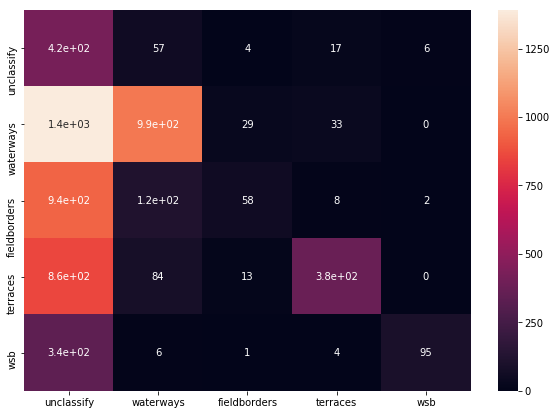

In [211]:
import pandas as pd
import seaborn as sn
labels = ['unclassify', 'waterways', 'fieldborders', 'terraces', 'wsb']
df_cm = pd.DataFrame(cm, index = [i for i in labels],
                  columns = [i for i in labels])
plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True)

In [189]:
gt_class_id, r['class_ids']

(array([2, 1]), array([1], dtype=int32))

In [190]:
gt_match

array([0., 0.])

In [191]:
pred_match

array([0.])

In [174]:
pred_match>0

array([False])

In [175]:
pred_match * r['class_ids']

array([0.])

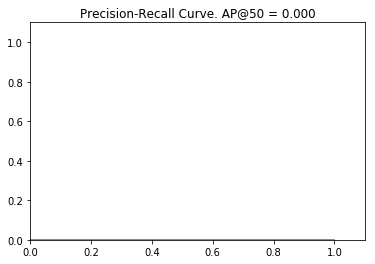

In [97]:
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id,
                             r["rois"], r["class_ids"], r["scores"])
visualize.plot_precision_recall(AP, precisions, recalls)

In [96]:
r['class_ids'] = np.array([0]).astype(np.uint8)
r['class_ids'] 

array([0], dtype=uint8)

IndexError: index 0 is out of bounds for axis 0 with size 0

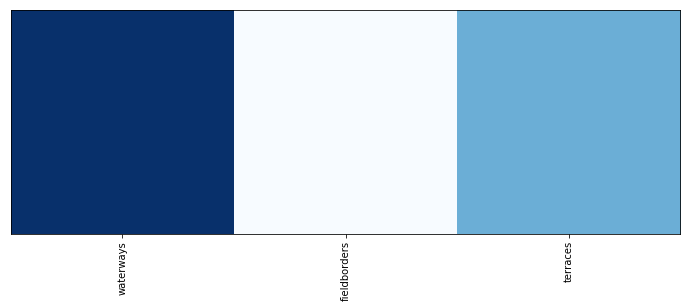

In [98]:
visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset_val.class_names)

### plot gt_masks and pred_masks on the same image

In [63]:
# original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
# modellib.load_image_gt(dataset_val, inference_config, 
#                        image_id, use_mini_mask=False)

# visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
#                             dataset_train.class_names, figsize=(8, 8))

In [64]:
# visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
#                             dataset_val.class_names, r['scores'], ax=get_ax())

# jac_dict = {}

# for cls in [1,2]:
#     jac_dict[cls] = []

# for clsid in [1,2]:         
#     gt_index = np.where(gt_class_id == clsid)
#     if gt_index[0].size ==0:
#         jac_dict[clsid].append(0)
#     else:
#         gt_mask_per_class = gt_mask[:,:,gt_index[0]]

#         _gt_sum = np.zeros((gt_mask.shape[0],gt_mask.shape[1]))

#         for gt_num in range(gt_mask_per_class.shape[2]):
#             _gt =  gt_mask_per_class[:,:,gt_num]
#             _gt_sum = _gt_sum + _gt

#         _gt_union = (_gt_sum>0).astype(int)


#         pred_index = np.where(r['class_ids'] == clsid)
#         pred_mask_per_class = r['masks'][:,:,pred_index[0]]

#         _mask_sum = np.zeros((r['masks'].shape[0],r['masks'].shape[1]))

#         for num in range(pred_mask_per_class.shape[2]):
#             _mask = pred_mask_per_class[:,:,num]
#             _mask_sum = _mask_sum + _mask

#         _mask_union = (_mask_sum>0).astype(int)

#         jac_dict[clsid].append(jaccard_coef(_mask_union, _gt_union))
        
# print (jac_dict)

Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_0001.h5
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   89.10000
image_metas              shape: (1, 11)               min:    0.00000  max:  256.00000
Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_0002.h5
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   89.10000
image_metas              shape: (1, 11)               min:    0.00000  max:  256.00000
Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_0003.h5
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            sha

/opt/anaconda3/lib/python3.5/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   89.10000
image_metas              shape: (1, 11)               min:    0.00000  max:  256.00000
Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_0023.h5
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   89.10000
image_metas              shape: (1, 11)               min:    0.00000  max:  256.00000
Loading weights from  /home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_0024.h5
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  200.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   89.10000
image_metas              shape: (1, 11)   

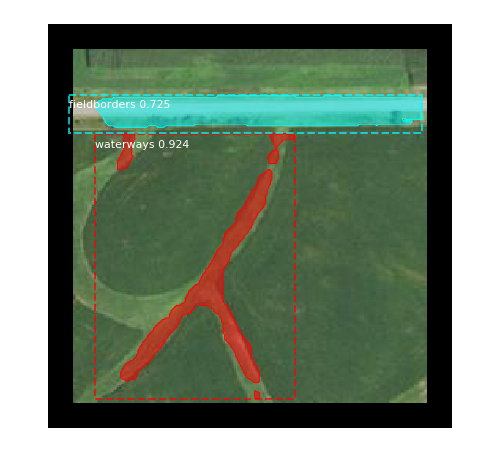

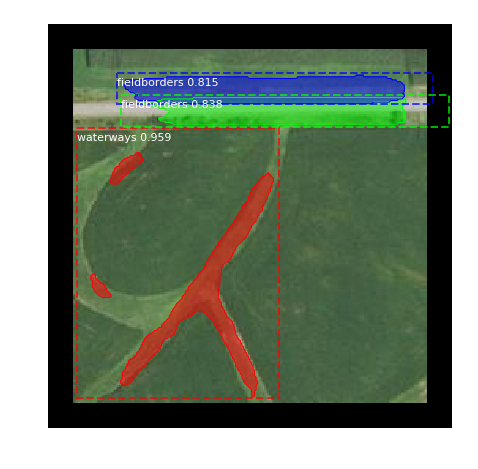

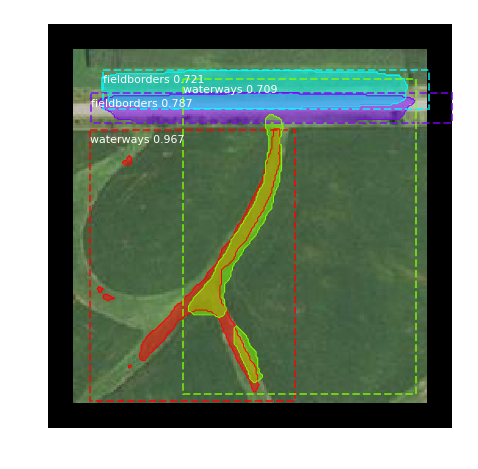

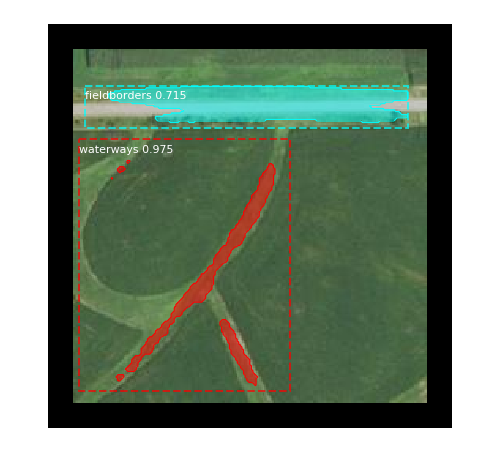

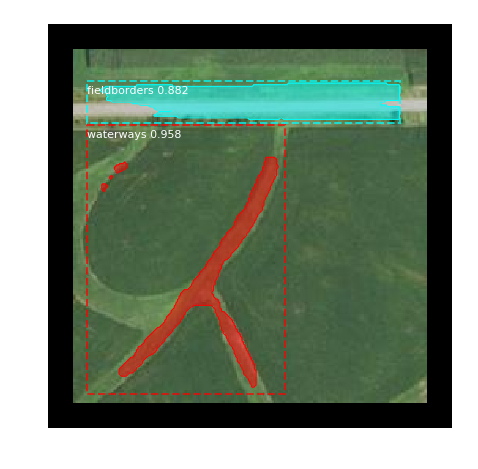

...

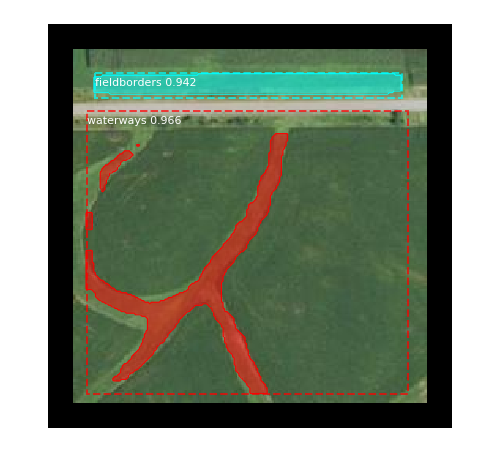

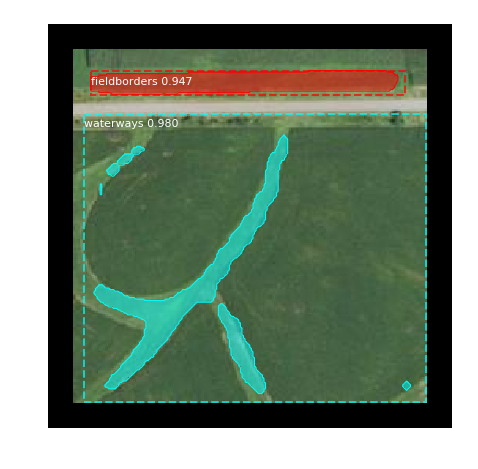

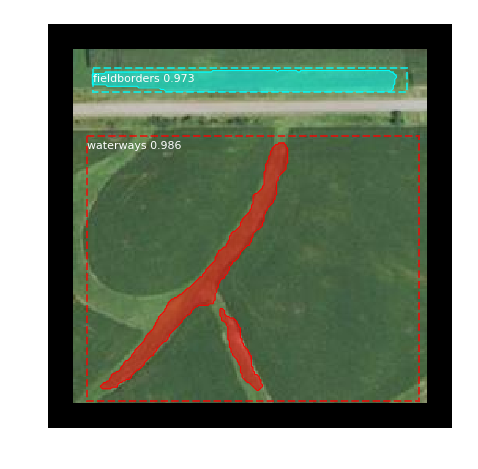

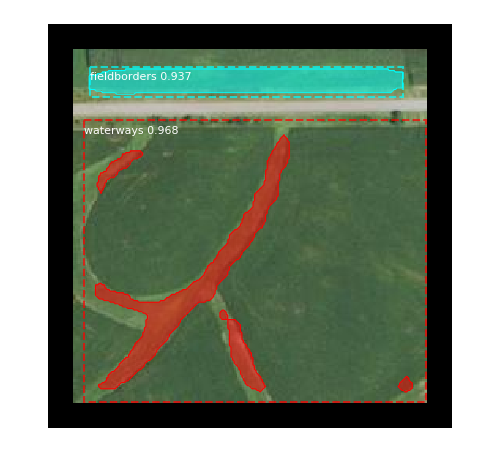

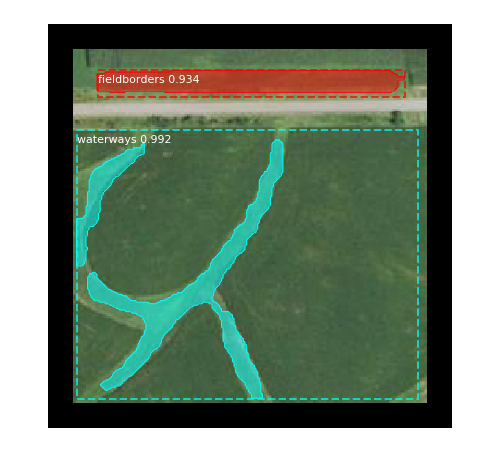

In [23]:

# jac_dict = {}

# for cls in [1,2]:
#     jac_dict[cls] = []
    
# for i in range(1, 101):
# # Get path to saved weights
#     model_path = '/home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_'+"{0:0=4d}".format(i)+'.h5'

#     print("Loading weights from ", model_path)
#     model.load_weights(model_path, by_name=True)

#     results = model.detect([original_image], verbose=1)
#     r = results[0]
       
#     visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
#                                 dataset_val.class_names, r['scores'], ax=get_ax())

#     for clsid in [1,2]:         
#         gt_index = np.where(gt_class_id == clsid)
#         if gt_index[0].size ==0:
#             jac_dict[clsid].append(0)
#         else:
#             gt_mask_per_class = gt_mask[:,:,gt_index[0]]
            
#             _gt_sum = np.zeros((gt_mask.shape[0],gt_mask.shape[1]))

#             for gt_num in range(gt_mask_per_class.shape[2]):
#                 _gt =  gt_mask_per_class[:,:,gt_num]
#                 _gt_sum = _gt_sum + _gt

#             _gt_union = (_gt_sum>0).astype(int)
        

#             pred_index = np.where(r['class_ids'] == clsid)
#             pred_mask_per_class = r['masks'][:,:,pred_index[0]]

#             _mask_sum = np.zeros((r['masks'].shape[0],r['masks'].shape[1]))

#             for num in range(pred_mask_per_class.shape[2]):
#                 _mask = pred_mask_per_class[:,:,num]
#                 _mask_sum = _mask_sum + _mask

#             _mask_union = (_mask_sum>0).astype(int)

#             jac_dict[clsid].append(jaccard_coef(_mask_union, _gt_union))
            


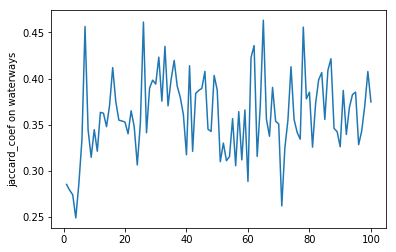

In [25]:
# import matplotlib.pyplot as plt
# x = list(range(1, 101))
# plt.plot(x, jac_dict[1], label = 'mask')
# plt.ylabel('jaccard_coef on waterways')
# plt.show()

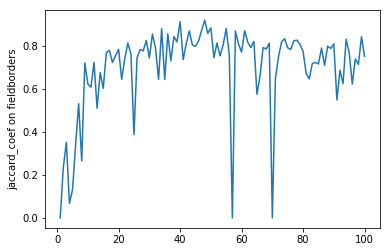

In [27]:

# x = list(range(1, 101))
# plt.plot(x, jac_dict[2], label = 'mask')
# plt.ylabel('jaccard_coef on fieldborders')
# plt.show()

In [ ]:
def jaccard_coef(y_true, y_pred):
    intersec = y_true*y_pred
    union = np.logical_or(y_true, y_pred).astype(int)
    if intersec.sum() == 0:
        jac_coef = 0
    else:
        jac_coef = intersec.sum()/union.sum()
    return jac_coef

In [65]:
gt_class_id, r['class_ids']

(array([4]), array([4], dtype=int32))

In [66]:
len(gt_bbox), len(r['rois'])

(1, 1)

In [71]:
x_min, x_max, y_min, y_max = gt_bbox[0]
print (x_min, x_max, y_min, y_max)

63 65 191 84


In [70]:
gt_bbox, r['rois']

(array([[ 63,  65, 191,  84]], dtype=int32),
 array([[ 18,  60, 240, 227]], dtype=int32))

In [82]:
jac_dict = {}

# for cls in [1,2, 3, 4]:
#     jac_dict[cls] = []

original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config, 
                               image_id, use_mini_mask=False)
results = model.detect([original_image], verbose=1)
r = results[0]

for clsid in list(CLASS_DICT.keys()):         
    jac_dict[clsid] = []
    gt_index = np.where(gt_class_id == clsid)
    if gt_index[0].size ==0 or len(r['masks']) == 0:
        jac_dict[clsid].append(0)
    else:
        gt_mask_per_class = gt_mask[:,:,gt_index[0]]

        _gt_sum = np.zeros((gt_mask.shape[0],gt_mask.shape[1]))

        for gt_num in range(gt_mask_per_class.shape[2]):
            _gt =  gt_mask_per_class[:,:,gt_num]
            _gt_sum = _gt_sum + _gt

        _gt_union = (_gt_sum>0).astype(int)


        pred_index = np.where(r['class_ids'] == clsid)
        pred_mask_per_class = r['masks'][:,:,pred_index[0]]

        _mask_sum = np.zeros((r['masks'].shape[0],r['masks'].shape[1]))

        for num in range(pred_mask_per_class.shape[2]):
            _mask = pred_mask_per_class[:,:,num]
            _mask_sum = _mask_sum + _mask

        _mask_union = (_mask_sum>0).astype(int)

        jac_dict[clsid].append(jaccard_coef(_mask_union, _gt_union))

Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  188.00000
molded_images            shape: (1, 256, 256, 3)      min: -123.70000  max:   84.10000
image_metas              shape: (1, 11)               min:    0.00000  max:  256.00000


In [85]:
gt_class_id

array([1])

In [86]:
r['class_ids']

array([1, 2], dtype=int32)

In [94]:
y_true = list(gt_class_id)
print (y_true)
y_pred = list(r['class_ids'])

[1]


In [95]:
for i in range(NUM_CLASSES):
    while len(y_true) < len(y_pred_id):
        y_true.append(0)
    while len(y_true) > len(y_pred_id):
        y_pred.append(0)

In [96]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)
print (cm)

[[0 0 1]
 [0 1 0]
 [0 0 0]]


In [ ]:
y_true_dict = {}
# y_true_dict [0] = []
y_true_dict [1] = []
y_true_dict [2] = []

In [ ]:
y_pred_dict = {}
# y_pred_dict [0] = []
y_pred_dict [1] = []
y_pred_dict [2] = []

In [98]:
gt_class_id, r['class_ids']

(array([2]), array([2, 2], dtype=int32))

In [55]:
len(gt_bbox), len(r['rois'])

(2, 1)

In [99]:
x = []
y= []

In [50]:
x = []
y= []

for image_id in dataset_val.image_ids[1:5]:   
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_val, inference_config, 
                                   image_id, use_mini_mask=False)
    results = model.detect([original_image], verbose=1)
    r = results[0]
    
    y_true = list(gt_class_id)
    y_pred = list(r['class_ids'])
    
#     for i in range(NUM_CLASSES):
    if len(y_true) < len(y_pred):
        while len(y_true) < len(y_pred):
            y_true.append(0)
    else:
        while len(y_true) > len(y_pred):
            y_pred.append(0)
    x.append(y_true)
    y.append(y_pred)

Processing 1 images
image                    shape: (256, 256, 3)         min:   19.00000  max:  195.00000
molded_images            shape: (1, 256, 256, 3)      min:  -93.70000  max:   71.30000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:    0.00000  max:  255.00000
molded_images            shape: (1, 256, 256, 3)      min: -122.70000  max:  151.10000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:   10.00000  max:  181.00000
molded_images            shape: (1, 256, 256, 3)      min: -109.70000  max:   64.20000
image_metas              shape: (1, 13)               min:    0.00000  max:  256.00000
Processing 1 images
image                    shape: (256, 256, 3)         min:   17.00000  max:  208.00000
molded_images            shape: (1, 256, 256, 3)  

In [51]:
x_extend = [item for sublist in x for item in sublist]
y_extend = [item for sublist in y for item in sublist]

In [52]:
len(x_extend), len(y_extend)

(7, 7)

In [120]:
cm = confusion_matrix(x_extend, y_extend)
print (cm)

[[ 2  0  2]
 [ 0  5  7]
 [ 2  3 11]]


In [92]:
y_true

[1, 0]

In [88]:
a = [1, 0]
b = [1, 2]

In [89]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(a, b)
print (cm)

[[0 0 1]
 [0 1 0]
 [0 0 0]]


In [83]:
jac_dict

{1: [0.6526533425223984], 2: [0]}

In [ ]:
def jac_per_image(image_id):
    
    jac_dict = {}

    # for cls in [1,2, 3, 4]:
    #     jac_dict[cls] = []
        
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset_val, inference_config, 
                                   image_id, use_mini_mask=False)
    results = model.detect([original_image], verbose=1)
    r = results[0]
    
    for clsid in list(CLASS_DICT.keys()):         
        jac_dict[clsid] = []
        gt_index = np.where(gt_class_id == clsid)
        if gt_index[0].size ==0 or len(r['masks']) == 0:
            jac_dict[clsid].append(0)
        else:
            gt_mask_per_class = gt_mask[:,:,gt_index[0]]

            _gt_sum = np.zeros((gt_mask.shape[0],gt_mask.shape[1]))

            for gt_num in range(gt_mask_per_class.shape[2]):
                _gt =  gt_mask_per_class[:,:,gt_num]
                _gt_sum = _gt_sum + _gt

            _gt_union = (_gt_sum>0).astype(int)


            pred_index = np.where(r['class_ids'] == clsid)
            pred_mask_per_class = r['masks'][:,:,pred_index[0]]

            _mask_sum = np.zeros((r['masks'].shape[0],r['masks'].shape[1]))

            for num in range(pred_mask_per_class.shape[2]):
                _mask = pred_mask_per_class[:,:,num]
                _mask_sum = _mask_sum + _mask

            _mask_union = (_mask_sum>0).astype(int)

            jac_dict[clsid].append(jaccard_coef(_mask_union, _gt_union))
            
    return jac_dict

In [52]:
# import matplotlib.pyplot as plt
# x = list(range(1, 21))
# plt.plot(x, jac1, label = 'mask1')
# plt.plot(x, jac2, label = 'mask2')
# plt.plot(x, jac_sum, label = 'mask_sum')
# plt.legend()
# plt.xticks(x)
# plt.xlabel('epoches')
# plt.ylabel('jaccard_coef')
# plt.show()

In [53]:
# def jac_per_image(image_id):
    
#     jac3 = []
#     jac_dict = {}

#     for cls in [1,2]:
#         jac_dict[cls] = []
        
#     original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
#             modellib.load_image_gt(dataset_val, inference_config, 
#                                    image_id, use_mini_mask=False)
#     results = model.detect([original_image], verbose=1)
#     r = results[0]
    
#     for clsid in [1,2]:         
#         gt_index = np.where(gt_class_id == clsid)
#         if gt_index[0].size ==0:
#             jac_dict[clsid].append(0)
#         else:
#             gt_mask_per_class = gt_mask[:,:,gt_index[0]]

#             _gt_sum = np.zeros((gt_mask.shape[0],gt_mask.shape[1]))

#             for gt_num in range(gt_mask_per_class.shape[2]):
#                 _gt =  gt_mask_per_class[:,:,gt_num]
#                 _gt_sum = _gt_sum + _gt

#             _gt_union = (_gt_sum>0).astype(int)


#             pred_index = np.where(r['class_ids'] == clsid)
#             pred_mask_per_class = r['masks'][:,:,pred_index[0]]

#             _mask_sum = np.zeros((r['masks'].shape[0],r['masks'].shape[1]))

#             for num in range(pred_mask_per_class.shape[2]):
#                 _mask = pred_mask_per_class[:,:,num]
#                 _mask_sum = _mask_sum + _mask

#             _mask_union = (_mask_sum>0).astype(int)

#             jac_dict[clsid].append(jaccard_coef(_mask_union, _gt_union))
            
#         return jac_dict

In [54]:
# # Compute VOC-Style mAP @ IoU=0.5
# # Running on 10 images. Increase for better accuracy.
# mAP = []
# mJac_cls1 = []
# mJac_cls2 = []
# for i in range(1, 30):
# # Get path to saved weights
#     model_path = '/home/tinzha/Projects/LandOLakes/logs/coco20180315T0245/mask_rcnn_coco_'+"{0:0=4d}".format(i)+'.h5'

#     print("Loading weights from ", model_path)
#     model.load_weights(model_path, by_name=True)

# #     image_ids = np.random.choice(dataset_val.image_ids, 1) # change the number of images
#     APs = []
#     jac_cls1 = []
#     jac_cls2 = []
#     for image_id in dataset_val.image_ids[1:2]:
#         # Load image and ground truth data
#         image, image_meta, gt_class_id, gt_bbox, gt_mask =\
#             modellib.load_image_gt(dataset_val, inference_config,
#                                    image_id, use_mini_mask=False)
#         molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
        
# #         visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
# #                             dataset_train.class_names, figsize=(8, 8))
#         # Run object detection
#         results = model.detect([image], verbose = False)
#         r = results[0]
        
#         visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
#                             dataset_val.class_names, r['scores'], ax=get_ax())
#         # Compute AP
#         AP, precisions, recalls, overlaps =\
#             utils.compute_ap(gt_bbox, gt_class_id,
#                              r["rois"], r["class_ids"], r["scores"])
#         APs.append(AP)

#         # compute jaccard
#         jac_dict_per_class = jac_per_image(image_id)
#         jac_cls1.append(np.mean(jac_dict_per_class[1]))
#         jac_cls2.append(np.mean(jac_dict_per_class[2]))
    
#     mAP.append(np.mean(APs))
#     mJac_cls1.append(np.mean(jac_cls1))
#     mJac_cls2.append(np.mean(jac_cls2))
#     print("mAP: ", np.mean(APs))
#     print ("jac for class 1: ", np.mean(mJac_cls1))
#     print ("jac for class 2: ", np.mean(mJac_cls2))